In [ ]:
!pip install git+git://github.com/fastai/fastai.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning git://github.com/fastai/fastai.git to /tmp/pip-req-build-1uj65iwy
  Running command git clone -q git://github.com/fastai/fastai.git /tmp/pip-req-build-1uj65iwy
  fatal: unable to connect to github.com:
  github.com[0: 140.82.114.3]: errno=Connection timed out

ERROR: Command errored out with exit status 128: git clone -q git://github.com/fastai/fastai.git /tmp/pip-req-build-1uj65iwy Check the logs for full command output.


In [ ]:
import numpy as np 
import pandas as pd 
import fastai
fastai.__version__


'2.7.10'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from fastai.vision.all import *

path = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/'
Path(path).ls()[:3]
df1 = pd.read_csv('/content/drive/MyDrive/DeepLearningFall23/Project/coins_count_values.csv')
df1.head()

,folder,image_name,coins_count
0,all_coins,01207e3d7e.jpg,5
1,all_coins,0140acf6eb.jpg,4
2,all_coins,025c8579f0.jpg,2
3,all_coins,028ca794e7.jpg,4
4,all_coins,02e080206f.jpg,40


In [ ]:
coins_series = df1["coins_count"].copy()
folder_series = df1["folder"].copy()
images_series = df1["image_name"].copy()

In [ ]:
fp = []

for i in range(0, 1444):
    fp.append("../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/" 
              + folder_series[i] + "/" + images_series[i])
    
file_paths_series = pd.Series(fp, name="Filepath")

In [ ]:
file_paths_series

0       ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/01207e3d7e.jpg
1       ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/0140acf6eb.jpg
2       ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/025c8579f0.jpg
3       ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/028ca794e7.jpg
4       ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/02e080206f.jpg
                                                  ...                                           
1439    ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/yen_coins/f8934b8498.jpg
1440    ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/yen_coins/fb5981d5de.jpg
1441    ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/yen_coins/fb6f6573b6.jpg
1442    ../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/yen_coins/fe3d6dfd45.jpg
1443    ../content/drive/MyDri

In [ ]:
df = pd.concat([file_paths_series, coins_series], axis=1)
df

,Filepath,coins_count
0,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/01207e3d7e.jpg,5
1,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/0140acf6eb.jpg,4
2,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/025c8579f0.jpg,2
3,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/028ca794e7.jpg,4
4,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/02e080206f.jpg,40
...,...,...
1439,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/yen_coins/f8934b8498.jpg,6
1440,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/yen_coins/fb5981d5de.jpg,2
1441,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/yen_coins/fb6f6573b6.jpg,2
1442,../content/drive/MyDrive/DeepLearningFall23/Project/coin_images/yen_coins/fe3d6dfd45.jpg,1


In [ ]:
def get_x(df): return df['Filepath'] # path to images
def get_y(df): return df['coins_count'] # labels

d = DataBlock(blocks=(ImageBlock, RegressionBlock),    # types of input and output
         get_x = get_x,                                # function to get path to images
         get_y = get_y,                                # function fo get labels
         splitter=RandomSplitter(),                    # random splitter (20% for validation)
         item_tfms=Resize(224, ResizeMethod.Squish),)  # resize and squish images 

In [ ]:
dl = d.dataloaders(df)
len(dl.train_ds), len(dl.valid_ds)


(1156, 288)

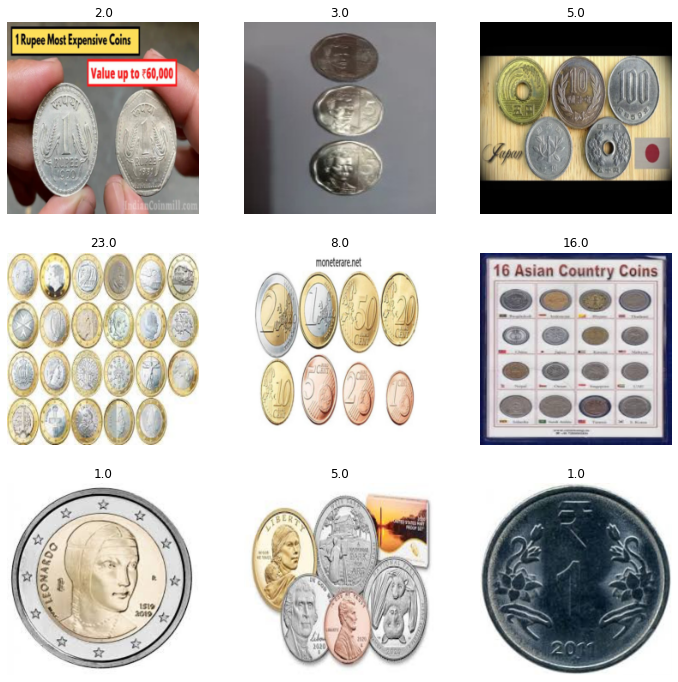

In [ ]:
dl.show_batch(figsize=(12,12))

In [ ]:
learn = cnn_learner(dl, resnet18, metrics=mae)
learn.fine_tune(8, 5e-2)

/usr/local/lib/python3.8/dist-packages/fastai/vision/learner.py:288: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


epoch,train_loss,valid_loss,mae,time
0,42.265659,42.779484,5.411125,04:02


epoch,train_loss,valid_loss,mae,time
0,25.565474,24.785099,3.651170,05:30
1,20.449078,64.000145,3.117579,05:26
2,21.216513,213.515808,9.677171,05:21
3,22.585646,8.564564,2.095013,05:22
4,20.678661,3.987895,1.271123,05:21
5,18.337305,4.277072,1.455630,05:23
6,16.543028,2.981415,1.070804,05:24
7,14.111493,2.769962,0.941900,05:23


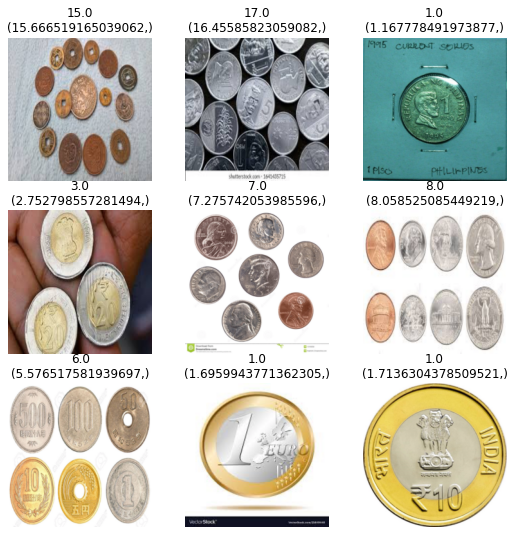

In [ ]:
learn.show_results()

**Model Predictions**

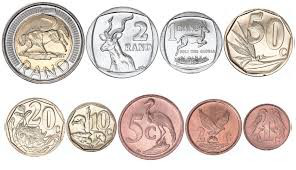

In [ ]:
import PIL
PIL.Image.open('/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/6d2e7e9448.jpg')

In [ ]:
learn.predict('/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/6d2e7e9448.jpg')

((7.929831504821777), TensorBase([7.9298]), TensorBase([7.9298]))

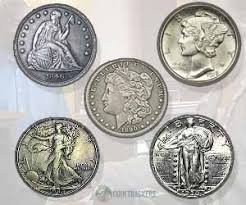

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/01207e3d7e.jpg'
PIL.Image.open(path1)


In [ ]:
learn.predict(path1) #5 images in actual file

((4.249095439910889), TensorBase([4.2491]), TensorBase([4.2491]))

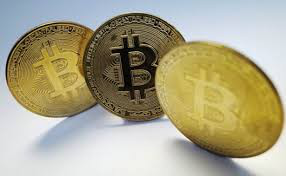

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/05c7bef607.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #3 images in actual file

((2.6383466720581055), TensorBase([2.6383]), TensorBase([2.6383]))

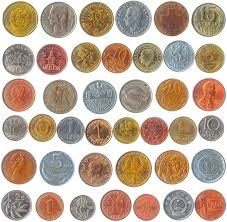

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/4a4bd0f725.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #40 images in actual file

((38.670501708984375), TensorBase([38.6705]), TensorBase([38.6705]))

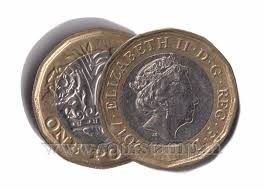

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/4ca15155e9.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) 

((1.7473702430725098), TensorBase([1.7474]), TensorBase([1.7474]))

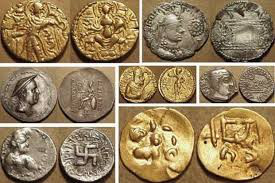

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/06de4d46b4.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #14 in actual image

((16.05916976928711), TensorBase([16.0592]), TensorBase([16.0592]))

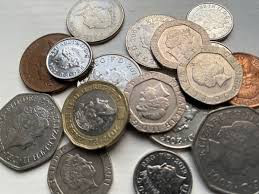

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/21ad309395.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #15 in actual image

((15.080010414123535), TensorBase([15.0800]), TensorBase([15.0800]))

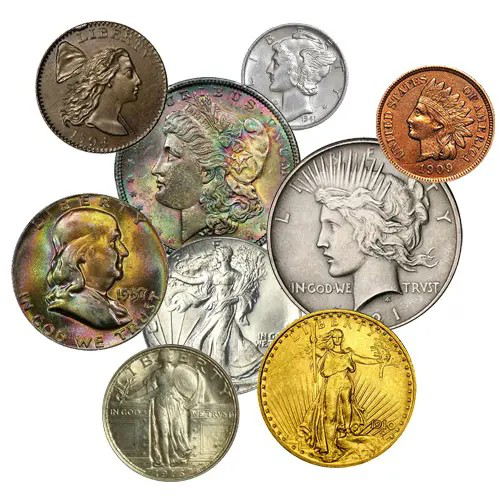

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/27ad5d7140.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #9 in actual image

((7.3897247314453125), TensorBase([7.3897]), TensorBase([7.3897]))

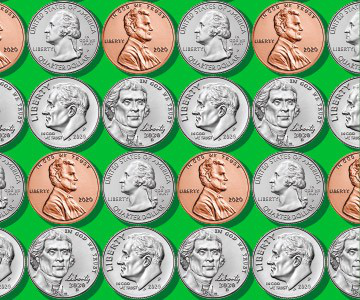

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/79eb826b40.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #24 in actual image

((27.51170539855957), TensorBase([27.5117]), TensorBase([27.5117]))

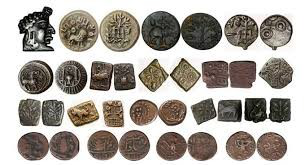

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/990db901a0.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #34 in actual image

((31.266887664794922), TensorBase([31.2669]), TensorBase([31.2669]))

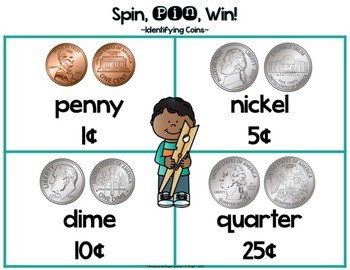

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/11178d409d.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #8 in actual image

((9.563948631286621), TensorBase([9.5639]), TensorBase([9.5639]))

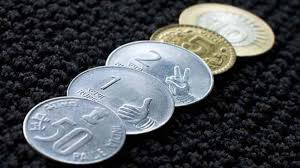

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/97868f7555.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #5 in actual image

((3.194319248199463), TensorBase([3.1943]), TensorBase([3.1943]))

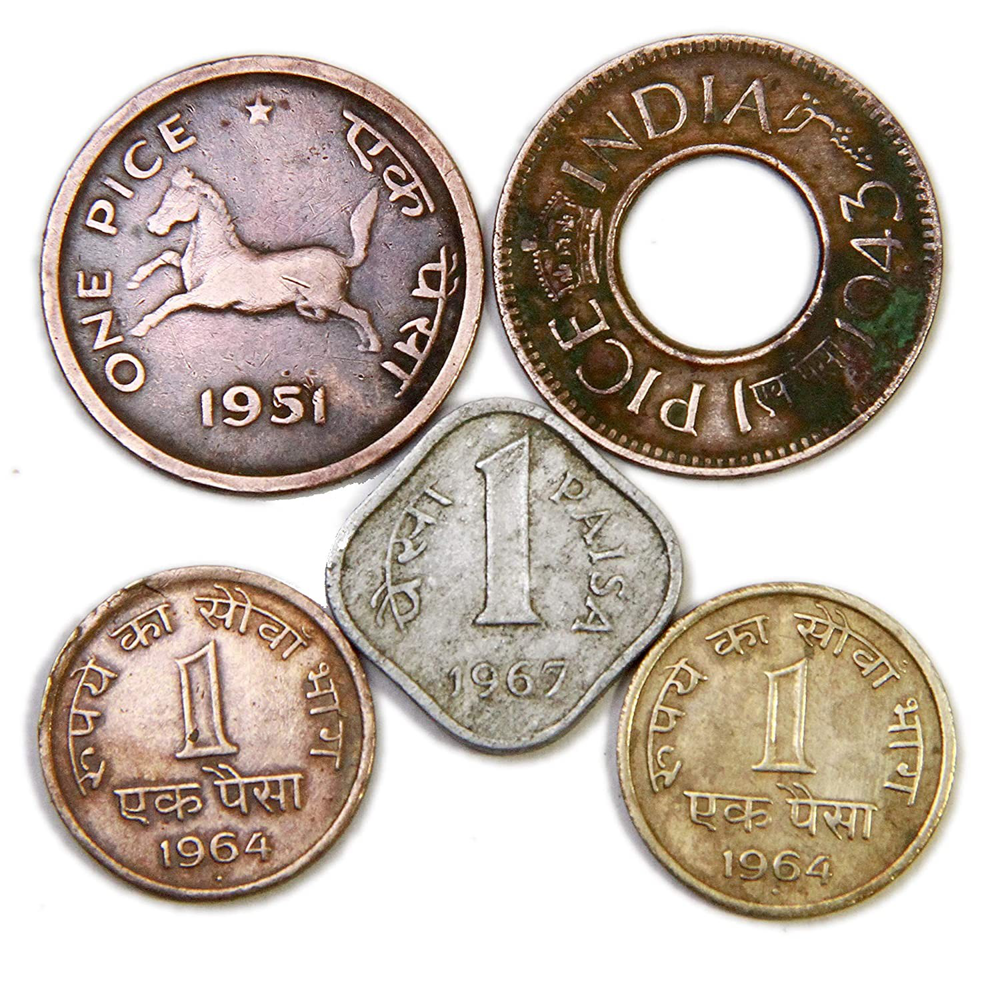

In [ ]:
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/coin_images/all_coins/aaf925663f.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) # 5 in actual image

((4.221313953399658), TensorBase([4.2213]), TensorBase([4.2213]))

**Test on Google Images**

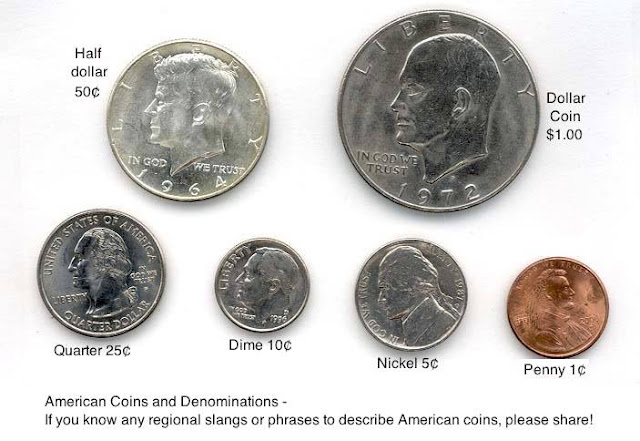

In [ ]:
#Google Image 1
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/GoogleImages/American-coins.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #6 in actual image

((6.438152313232422), TensorBase([6.4382]), TensorBase([6.4382]))

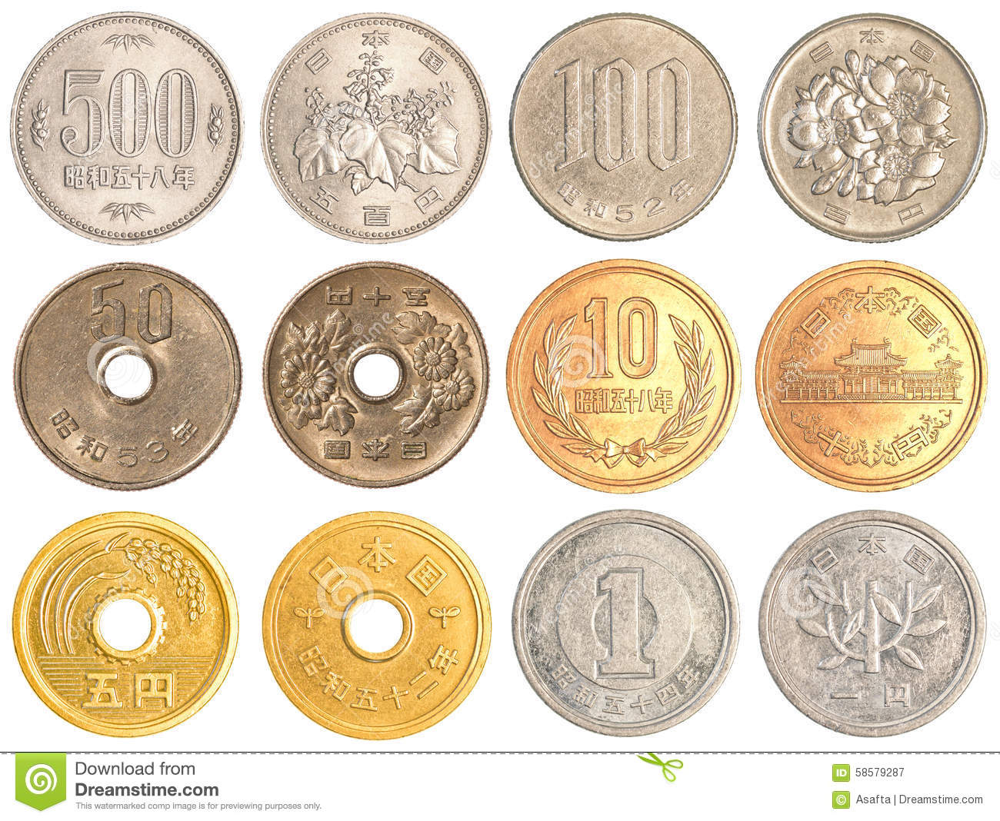

In [ ]:
#Google Image 2
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/GoogleImages/japanese-yen-coins.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #12 in actual image

((12.043760299682617), TensorBase([12.0438]), TensorBase([12.0438]))

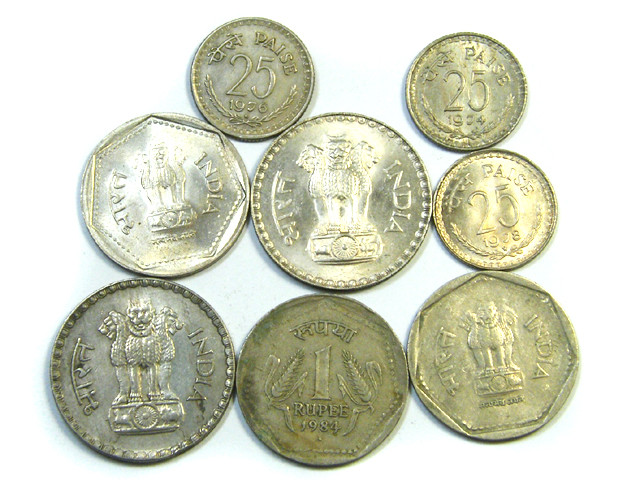

In [ ]:
#Google Image 3
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/GoogleImages/Indian Coin.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #8 in actual image

((7.915346622467041), TensorBase([7.9153]), TensorBase([7.9153]))

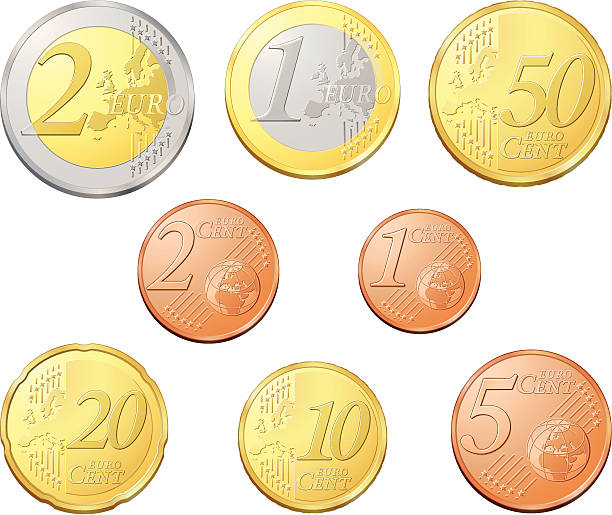

In [ ]:
#Google Image 4
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/GoogleImages/euro coins.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #8 in actual image

((7.299788475036621), TensorBase([7.2998]), TensorBase([7.2998]))

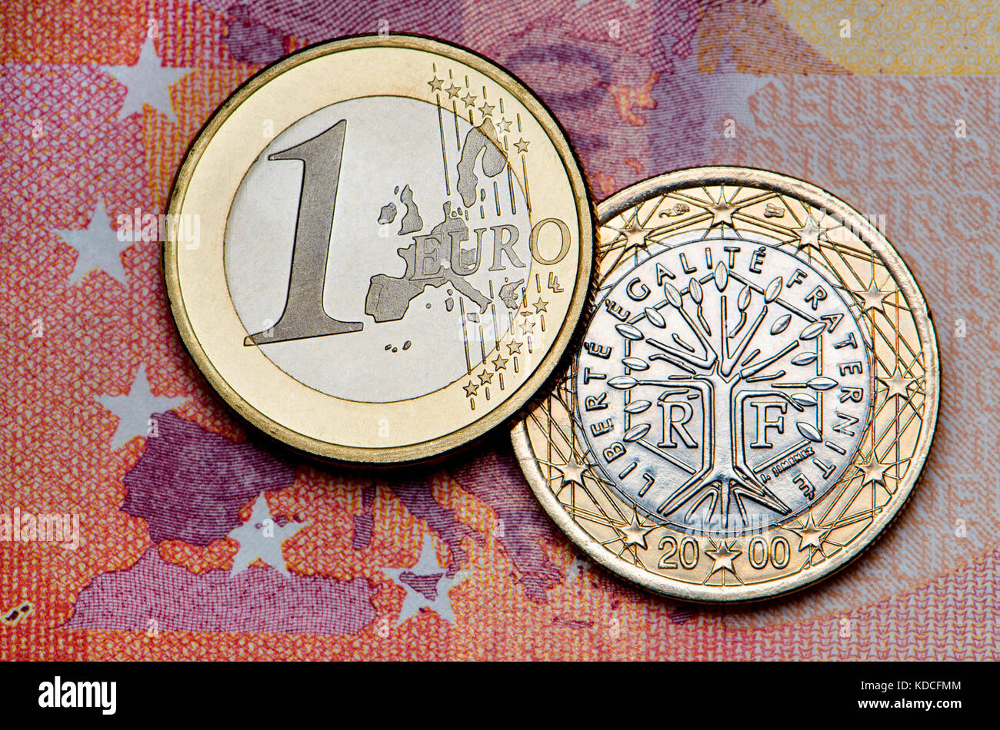

In [ ]:
#Google Image 5
path1 = '/content/drive/MyDrive/DeepLearningFall23/Project/GoogleImages/euro coins2.jpg'
PIL.Image.open(path1)

In [ ]:
learn.predict(path1) #2 in actual image

((2.017625331878662), TensorBase([2.0176]), TensorBase([2.0176]))